# Using the DuckDB Network Database

This notebook provides query helpers and visualisations for the enriched road network.

## Traffic data storage

Congestion is stored in **per-source history tables** — the `driving.edges` table
contains pure OSM network data with no traffic columns. All congestion reads use a CTE
that joins with the source-specific history table to find the latest run.

| Table | Schema | Content |
|---|---|---|
| `edges` | `driving` / `walking` / `cycling` | Road segments — geometry, speed, cost, H3 index |
| `runs` | `main` | One row per pipeline execution (all sources) |
| `mapbox_congestion_history` | `main` | Mapbox congestion time-series per edge |
| `google_congestion_history` | `main` | Google congestion time-series per edge |
| `tomtom_congestion_history` | `main` | TomTom congestion + raw traffic_level per edge |

**Read congestion via the `traffic_db` library:**
```python
db.get_edges(source='mapbox')        # joins latest mapbox_congestion_history
db.get_congestion_summary('google')  # groups by latest google_congestion_history
db.get_congestion_comparison()       # pivots mapbox + google side by side
```

In [1]:
%%time
import sys
sys.path.insert(0, '..')

import geopandas as gpd
import pandas as pd
import folium
import yaml
from pathlib import Path

from scripts.traffic_db import TrafficDB, CONGESTION_COLORS, CONGESTION_ORDER

# ── Configuration ─────────────────────────────────────────────────────────
NAME = 'sodermalm'
# ─────────────────────────────────────────────────────────────────────────

CONFIG_PATH = Path(f'../config/{NAME}.yaml')
if CONFIG_PATH.exists():
    with open(CONFIG_PATH) as f:
        cfg = yaml.safe_load(f)
    DB_PATH = Path(cfg['output_path']) / f"{cfg['name']}.duckdb"
else:
    DB_PATH = Path(f'../db/{NAME}.duckdb')

print(f'Database : {DB_PATH}')
print(f'Exists   : {DB_PATH.exists()}  ({DB_PATH.stat().st_size/1_048_576:.1f} MB)' if DB_PATH.exists() else 'NOT FOUND')

Database : /home/kaveh/projects/osm-traffic-enrichment/db/sodermalm.duckdb
Exists   : True  (23.8 MB)
CPU times: user 1.87 s, sys: 50.9 ms, total: 1.92 s
Wall time: 412 ms


---
## Library: `scripts/traffic_db.py`

All helpers come from `scripts/traffic_db.py`.
See [`docs/traffic_db.md`](../docs/traffic_db.md) for the full API reference.

```python
db.get_edges(mode, source, highway, congestion, name, limit)
db.get_network_stats(mode)
db.get_nearby_edges(lon, lat, radius_m, source)
db.get_congestion_summary(source)
db.get_history_index()
db.get_congestion_history(edge_id / road_name, source='mapbox')
db.get_congestion_comparison(sources=['mapbox', 'google'])
db.write_congestion(edge_congestion, source, zoom, n_segments)
db.plot_edges(gdf, color_col)
db.plot_comparison(sources=['mapbox', 'google'])
```

In [2]:
%%time
db = TrafficDB(DB_PATH, read_only=True)
print('TrafficDB ready.')
print('Tables:')
display(db.list_tables())

TrafficDB ready.
Tables:


,schema,table_name,columns
0,cycling,edge_graph,4
1,cycling,edges,19
2,cycling,nodes,3
3,cycling,way_nodes,3
4,cycling,ways,10
5,driving,edge_graph,4
6,driving,edges,19
7,driving,nodes,3
8,driving,turn_restrictions,5
9,driving,way_nodes,3


CPU times: user 327 ms, sys: 22.4 ms, total: 350 ms
Wall time: 57.1 ms


---
## 1. Connect and inspect the database

In [3]:
%%time
print('All tables in the database:')
display(db.list_tables())

All tables in the database:


,schema,table_name,columns
0,cycling,edge_graph,4
1,cycling,edges,19
2,cycling,nodes,3
3,cycling,way_nodes,3
4,cycling,ways,10
5,driving,edge_graph,4
6,driving,edges,19
7,driving,nodes,3
8,driving,turn_restrictions,5
9,driving,way_nodes,3


CPU times: user 5.24 ms, sys: 7.61 ms, total: 12.8 ms
Wall time: 5.41 ms


---
## 2. Network statistics

In [4]:
%%time
display(db.get_network_stats())

,highway,edges,km,avg_speed_kmh,avg_cost_s
0,residential,2819,94.2,30.0,4.0
1,service,909,43.4,20.0,8.6
2,tertiary,365,17.5,35.0,4.9
3,unclassified,195,12.7,34.0,7.2
4,secondary,173,15.4,44.0,7.5
5,primary,21,1.6,50.0,5.4
6,living_street,17,0.8,18.0,11.2
7,trunk,15,4.6,60.0,18.4
8,trunk_link,14,1.1,47.0,6.3
9,secondary_link,14,0.2,51.0,0.8


CPU times: user 6.25 ms, sys: 5.08 ms, total: 11.3 ms
Wall time: 5.9 ms


---
## 3. Congestion overview

In [5]:
%%time
print('Mapbox:')
display(db.get_congestion_summary('mapbox'))
print('Google:')
display(db.get_congestion_summary('google'))

Mapbox:


,congestion,edges,km,pct
0,low,4409,182.0,96.8
1,no data,89,6.9,2.0
2,moderate,32,2.1,0.7
3,heavy,24,0.5,0.5


Google:


,congestion,edges,km,pct
0,no data,4013,151.9,88.1
1,low,296,22.2,6.5
2,severe,128,9.6,2.8
3,moderate,115,7.7,2.5
4,heavy,2,0.1,0.0


CPU times: user 13 ms, sys: 11.8 ms, total: 24.8 ms
Wall time: 15.7 ms


In [6]:
%%time
edges = db.get_edges(source='mapbox')
print(f'{len(edges):,} edges')
db.plot_edges(edges)

4,554 edges
CPU times: user 99.4 ms, sys: 16.5 ms, total: 116 ms
Wall time: 106 ms


---
## 4. Filter edges

### By congestion level

In [7]:
%%time
heavy = db.get_edges(source='mapbox', congestion='heavy')
print(f'Heavy (Mapbox): {len(heavy)} edges')
display(heavy[['edge_id','highway','name','length_m','congestion']].head(10))

heavy_g = db.get_edges(source='google', congestion='heavy')
print(f'Heavy (Google): {len(heavy_g)} edges')

Heavy (Mapbox): 24 edges


,edge_id,highway,name,length_m,congestion
0,175,residential,Ringvägen,12.895996,heavy
1,184,living_street,Högalidsgatan,13.453474,heavy
2,349,residential,Bjurholmsgatan,31.000412,heavy
3,436,secondary,Långholmsgatan,119.578941,heavy
4,448,residential,Östgötagatan,12.683040,heavy
5,1653,residential,Ringvägen,16.284557,heavy
6,1728,secondary_link,Verkstadsgatan,8.199173,heavy
7,2023,residential,Bjurholmsgatan,14.017198,heavy
8,2118,secondary,Långholmsgatan,44.296791,heavy
9,2225,secondary,Långholmsgatan,49.889874,heavy


Heavy (Google): 2 edges
CPU times: user 27.8 ms, sys: 4 ms, total: 31.8 ms
Wall time: 21.3 ms


### By road type

In [8]:
%%time
motorways = db.get_edges(highway='motorway')
print(f'Motorway edges: {len(motorways)}')
db.plot_edges(motorways)

Motorway edges: 0
No line geometries to plot.
CPU times: user 19 ms, sys: 4.22 ms, total: 23.2 ms
Wall time: 12.7 ms


### By road name

In [9]:
%%time
ring_mb = db.get_edges(name='Ringvägen', source='mapbox')
ring_gg = db.get_edges(name='Ringvägen', source='google')
print(f'Ringvägen: {len(ring_mb)} edges')
print(f'  Mapbox : {ring_mb["congestion"].value_counts().to_dict()}')
print(f'  Google : {ring_gg["congestion"].value_counts().to_dict()}')
db.plot_edges(ring_mb)

Ringvägen: 171 edges
  Mapbox : {'low': 160, 'no data': 6, 'heavy': 5}
  Google : {'no data': 80, 'low': 35, 'moderate': 31, 'severe': 24, 'heavy': 1}
CPU times: user 26.4 ms, sys: 4.69 ms, total: 31 ms
Wall time: 22.8 ms


---
## 5. Congestion history (time series)

Each source has its own history table (`mapbox_congestion_history`, `google_congestion_history`,
`tomtom_congestion_history`). The `source` parameter is now required.

In [10]:
%%time
display(db.get_runs())

,run_id,source,boundary_name,zoom,fetched_at,edges_with_data,n_segments
0,3,tomtom,sodermalm,14,2026-05-22 06:02:20,1727,72
1,2,google,sodermalm,16,2026-05-22 06:01:25,541,149627
2,1,mapbox,sodermalm,14,2026-05-22 06:00:13,4465,5566


CPU times: user 368 μs, sys: 6.88 ms, total: 7.25 ms
Wall time: 5.95 ms


In [11]:
%%time
history = db.get_congestion_history(road_name='Ringvägen', source='mapbox', limit=200)
if history.empty:
    print('No Mapbox history yet.')
else:
    print(f'{len(history)} rows for Ringvägen (Mapbox):')
    display(history[['run_id','fetched_at','source','edge_id','name','congestion']])

165 rows for Ringvägen (Mapbox):


,run_id,fetched_at,source,edge_id,name,congestion
0,1,2026-05-22 06:00:13,mapbox,6,Ringvägen,low
1,1,2026-05-22 06:00:13,mapbox,16,Ringvägen,low
2,1,2026-05-22 06:00:13,mapbox,58,Ringvägen,low
3,1,2026-05-22 06:00:13,mapbox,81,Ringvägen,low
4,1,2026-05-22 06:00:13,mapbox,82,Ringvägen,low
...,...,...,...,...,...,...
160,1,2026-05-22 06:00:13,mapbox,2993,Ringvägen,low
161,1,2026-05-22 06:00:13,mapbox,3545,Ringvägen,low
162,1,2026-05-22 06:00:13,mapbox,3811,Ringvägen,low
163,1,2026-05-22 06:00:13,mapbox,4211,Ringvägen,low


CPU times: user 10.8 ms, sys: 0 ns, total: 10.8 ms
Wall time: 8.07 ms


---
## 6. H3 spatial queries

Each edge has `from_cell` and `to_cell` H3 indices that link it to the boundary hex grid.

In [12]:
%%time
tables = {r[0] for r in db.con.execute(
    "SELECT table_name FROM information_schema.tables WHERE table_schema='main'"
).fetchall()}

if 'boundary_cells' not in tables:
    print('No H3 cells — run notebook 4 first.')
    cell_cong = None
else:
    df = db.con.execute(
        "SELECT h3_id, resolution, ST_AsText(geometry) AS wkt_geom FROM boundary_cells"
    ).df()
    cells = gpd.GeoDataFrame(
        df.drop(columns=['wkt_geom']),
        geometry=gpd.GeoSeries.from_wkt(df['wkt_geom']), crs='EPSG:4326',
    )
    print(f'{len(cells)} H3 cells at resolution {cells["resolution"].iloc[0]}')

    # Join latest mapbox congestion per H3 cell using the library CTE
    cte = db._latest_cte('mapbox')
    cell_cong = db.con.execute(f"""
        WITH {cte}
        SELECT e.from_cell AS h3_id, count(*) AS edges,
               round(sum(e.length_m)/1000, 2) AS km,
               mode() WITHIN GROUP (ORDER BY coalesce(l.congestion, 'no data')) AS dominant_congestion
        FROM driving.edges e
        LEFT JOIN latest_mapbox l ON e.edge_id = l.edge_id
        WHERE e.from_cell IS NOT NULL
        GROUP BY e.from_cell ORDER BY edges DESC
    """).df()
    display(cell_cong.head(10))

No H3 cells — run notebook 4 first.
CPU times: user 2.59 ms, sys: 0 ns, total: 2.59 ms
Wall time: 1.87 ms


In [13]:
%%time
if cell_cong is None or cell_cong.empty:
    print('No H3 cells — run notebook 5 first.')
else:
    sample_cell = cell_cong.iloc[0]['h3_id']
    # Use db.get_edges() which joins history via CTE
    cell_edges = db.get_edges(source='mapbox', limit=None)
    cell_edges = cell_edges[cell_edges['from_cell'] == sample_cell]
    print(f'Cell {sample_cell}: {len(cell_edges)} edges')
    db.plot_edges(cell_edges)

No H3 cells — run notebook 5 first.
CPU times: user 47 μs, sys: 0 ns, total: 47 μs
Wall time: 45.5 μs


---
## 7. Raw SQL queries

For anything the helper functions don't cover, run SQL directly.
DuckDB supports full SQL including spatial functions.

In [14]:
%%time
db.con.execute("""
    SELECT 'driving' AS mode, count(*) AS edges,
           round(sum(length_m)/1000, 1) AS km,
           round(sum(cost_s)/3600, 1)   AS total_travel_hours
    FROM driving.edges
    UNION ALL
    SELECT 'walking', count(*), round(sum(length_m)/1000,1), round(sum(cost_s)/3600,1) FROM walking.edges
    UNION ALL
    SELECT 'cycling', count(*), round(sum(length_m)/1000,1), round(sum(cost_s)/3600,1) FROM cycling.edges
""").df()

CPU times: user 3.51 ms, sys: 294 μs, total: 3.81 ms
Wall time: 2.27 ms


,mode,edges,km,total_travel_hours
0,driving,4554,191.6,6.8
1,walking,15414,436.0,87.2
2,cycling,5916,252.5,16.8


In [15]:
%%time
LON, LAT = 18.07, 59.315
nearby = db.get_nearby_edges(lon=LON, lat=LAT, radius_m=500)
print(f'Edges within 500m of ({LAT}, {LON}):')
display(nearby[['edge_id','name','highway','congestion','length_m','dist_m']].head(10))

Edges within 500m of (59.315, 18.07):


,edge_id,name,highway,congestion,length_m,dist_m
0,3002,Fatbursfaret,service,low,4.485177,73.0
1,4553,Fatbursfaret,service,low,4.485177,73.0
2,2721,Fatbursfaret,service,low,7.422368,78.0
3,4412,Fatbursfaret,service,low,7.422368,78.0
4,3844,None,service,low,7.832501,85.0
5,419,Västgötagränd,residential,low,51.865078,85.0
6,3223,Västgötagränd,residential,low,51.865078,85.0
7,1582,None,service,low,7.832501,85.0
8,3841,None,service,low,4.415298,91.0
9,1574,None,service,low,4.415298,91.0


CPU times: user 24.6 ms, sys: 61 μs, total: 24.6 ms
Wall time: 16.6 ms


---
## Mapbox vs Google — comparison

This section compares the congestion reported by each source for the same road network.

**Key difference to keep in mind:**
- **Mapbox** always assigns `low` to free-flowing roads → high coverage, many `low` edges
- **Google** only colors *congested* roads → free-flowing roads stay `no data`

So a road with Mapbox=`low` and Google=`no data` is most likely **flowing normally** —
both sources agree, they just express it differently.

### Comparison categories

| Mapbox | Google | Interpretation |
|---|---|---|
| `low` | `no data` | Normal flow — both agree, Google just doesn't color it |
| `low` | `low` | Both confirm low congestion |
| `moderate`/`heavy`/`severe` | `no data` | Mapbox detects congestion, Google doesn't (or missed it) |
| same non-low level | same non-low level | Both sources confirm congestion |
| different non-low levels | different non-low levels | Sources disagree — worth investigating |

In [16]:
%%time
both = db.get_congestion_comparison(sources=['mapbox', 'google'])

mapbox_ok = (both['congestion_mapbox'] != 'no data').sum()
google_ok  = (both['congestion_google'] != 'no data').sum()
total      = len(both)

print(f'Total edges     : {total:,}')
print(f'Mapbox coverage : {mapbox_ok:,} ({mapbox_ok/total*100:.1f}%)')
print(f'Google coverage : {google_ok:,} ({google_ok/total*100:.1f}%)')

print('\nMapbox:')
display(both['congestion_mapbox'].value_counts().reindex(CONGESTION_ORDER).dropna()
        .reset_index().rename(columns={'congestion_mapbox': 'congestion', 'count': 'edges'}))
print('Google:')
display(both['congestion_google'].value_counts().reindex(CONGESTION_ORDER).dropna()
        .reset_index().rename(columns={'congestion_google': 'congestion', 'count': 'edges'}))

Total edges     : 4,554
Mapbox coverage : 4,465 (98.0%)
Google coverage : 541 (11.9%)

Mapbox:


,congestion,edges
0,low,4409.0
1,moderate,32.0
2,heavy,24.0
3,no data,89.0


Google:


,congestion,edges
0,low,296
1,moderate,115
2,heavy,2
3,severe,128
4,no data,4013


CPU times: user 22.5 ms, sys: 7.8 ms, total: 30.3 ms
Wall time: 22.6 ms


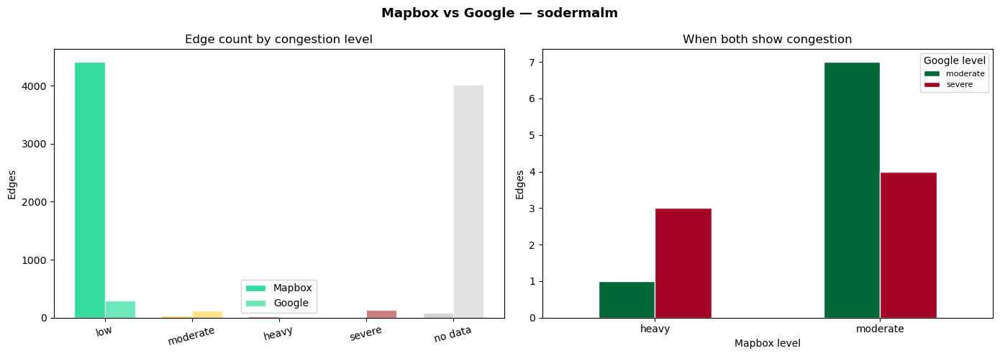

CPU times: user 315 ms, sys: 38 ms, total: 353 ms
Wall time: 399 ms


In [17]:
%%time
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(f'Mapbox vs Google — {NAME}', fontsize=13, fontweight='bold')

# Plot 1: edge count per level per source
ax = axes[0]
x, w = np.arange(len(CONGESTION_ORDER)), 0.35
for i, (label, col) in enumerate({'Mapbox': 'congestion_mapbox', 'Google': 'congestion_google'}.items()):
    counts = [both[col].value_counts().get(lvl, 0) for lvl in CONGESTION_ORDER]
    ax.bar(x + i*w, counts, w, label=label,
           color=[CONGESTION_COLORS[l] for l in CONGESTION_ORDER],
           edgecolor='white', alpha=0.85 if i == 0 else 0.6)
ax.set_xticks(x + w/2); ax.set_xticklabels(CONGESTION_ORDER, rotation=15)
ax.set_title('Edge count by congestion level'); ax.set_ylabel('Edges'); ax.legend()

# Plot 2: when both show congestion
ax = axes[1]
mb = both['congestion_mapbox']
gg = both['congestion_google']
both_cong = both[
    mb.isin(['moderate', 'heavy', 'severe']) &
    gg.isin(['moderate', 'heavy', 'severe'])
]
if len(both_cong):
    both_cong.groupby(['congestion_mapbox', 'congestion_google']).size().unstack(fill_value=0)\
             .plot(kind='bar', ax=ax, colormap='RdYlGn_r', edgecolor='white')
    ax.set_title('When both show congestion'); ax.set_xlabel('Mapbox level'); ax.set_ylabel('Edges')
    ax.tick_params(axis='x', rotation=0); ax.legend(title='Google level', fontsize=8)
else:
    ax.text(0.5, 0.5, 'No edges where both\nsources show congestion',
            ha='center', va='center', transform=ax.transAxes, fontsize=11, color='gray')
    ax.axis('off')

plt.tight_layout(); plt.show()

---
### Side-by-side map: Mapbox (left) vs Google (right)

The two maps use identical color scales so you can compare coverage and levels visually.

In [18]:
%%time
db.plot_comparison(zoom=13)

CPU times: user 498 ms, sys: 21.1 ms, total: 519 ms
Wall time: 500 ms


In [19]:
db.close()
print('Connection closed.')

Connection closed.
